In [39]:
import sqlalchemy as sql
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

In [3]:
myconn=sql.create_engine("mysql+pymysql://root:@localhost:3306/e-commerce")

In [4]:
a=myconn.table_names()

In [5]:
a


['april_sales',
 'august_sales',
 'december_sales',
 'february_sales',
 'january_sales',
 'july_sales',
 'june_sales',
 'march_sales',
 'may_sales',
 'november_sales',
 'october_sales',
 'september_sales']

In [9]:
data=pd.DataFrame()

for i in a:
    df=pd.read_sql_table(i,myconn)
    data=pd.concat([data,df])

In [10]:
data

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address
0,176558,USB-C Charging Cable,2,11.95,04/19/19 08:46,"917 1st St, Dallas, TX 75001"
1,None,None,None,None,None,None
2,176559,Bose SoundSport Headphones,1,99.99,04/07/19 22:30,"682 Chestnut St, Boston, MA 02215"
3,176560,Google Phone,1,600,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
4,176560,Wired Headphones,1,11.99,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
...,...,...,...,...,...,...
11681,259353,AAA Batteries (4-pack),3,2.99,09/17/19 20:56,"840 Highland St, Los Angeles, CA 90001"
11682,259354,iPhone,1,700,09/01/19 16:00,"216 Dogwood St, San Francisco, CA 94016"
11683,259355,iPhone,1,700,09/23/19 07:39,"220 12th St, San Francisco, CA 94016"
11684,259356,34in Ultrawide Monitor,1,379.99,09/19/19 17:30,"511 Forest St, San Francisco, CA 94016"


In [11]:
data.reset_index(drop=True,inplace =True)

In [12]:
data

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address
0,176558,USB-C Charging Cable,2,11.95,04/19/19 08:46,"917 1st St, Dallas, TX 75001"
1,None,None,None,None,None,None
2,176559,Bose SoundSport Headphones,1,99.99,04/07/19 22:30,"682 Chestnut St, Boston, MA 02215"
3,176560,Google Phone,1,600,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
4,176560,Wired Headphones,1,11.99,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
...,...,...,...,...,...,...
186845,259353,AAA Batteries (4-pack),3,2.99,09/17/19 20:56,"840 Highland St, Los Angeles, CA 90001"
186846,259354,iPhone,1,700,09/01/19 16:00,"216 Dogwood St, San Francisco, CA 94016"
186847,259355,iPhone,1,700,09/23/19 07:39,"220 12th St, San Francisco, CA 94016"
186848,259356,34in Ultrawide Monitor,1,379.99,09/19/19 17:30,"511 Forest St, San Francisco, CA 94016"


In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186850 entries, 0 to 186849
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   OrderID          186305 non-null  object
 1   Product          186305 non-null  object
 2   QuantityOrdered  186305 non-null  object
 3   PriceEach        186305 non-null  object
 4   OrderDate        186305 non-null  object
 5   Address          186305 non-null  object
dtypes: object(6)
memory usage: 8.6+ MB


In [14]:
data.isnull().sum()

OrderID            545
Product            545
QuantityOrdered    545
PriceEach          545
OrderDate          545
Address            545
dtype: int64

In [15]:
data.loc[(data["OrderID"].isnull()==True)]

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address
1,None,None,None,None,None,None
356,None,None,None,None,None,None
735,None,None,None,None,None,None
1433,None,None,None,None,None,None
1553,None,None,None,None,None,None
...,...,...,...,...,...,...
185176,None,None,None,None,None,None
185438,None,None,None,None,None,None
186042,None,None,None,None,None,None
186548,None,None,None,None,None,None


In [16]:
data_nm=data.loc[~(data["OrderID"].isnull()==True)]

In [18]:
data_nm.isnull().sum()

OrderID            0
Product            0
QuantityOrdered    0
PriceEach          0
OrderDate          0
Address            0
dtype: int64

In [20]:
data_nm.reset_index(drop= True,inplace=True)

In [21]:
data_nm

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address
0,176558,USB-C Charging Cable,2,11.95,04/19/19 08:46,"917 1st St, Dallas, TX 75001"
1,176559,Bose SoundSport Headphones,1,99.99,04/07/19 22:30,"682 Chestnut St, Boston, MA 02215"
2,176560,Google Phone,1,600,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
3,176560,Wired Headphones,1,11.99,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
4,176561,Wired Headphones,1,11.99,04/30/19 09:27,"333 8th St, Los Angeles, CA 90001"
...,...,...,...,...,...,...
186300,259353,AAA Batteries (4-pack),3,2.99,09/17/19 20:56,"840 Highland St, Los Angeles, CA 90001"
186301,259354,iPhone,1,700,09/01/19 16:00,"216 Dogwood St, San Francisco, CA 94016"
186302,259355,iPhone,1,700,09/23/19 07:39,"220 12th St, San Francisco, CA 94016"
186303,259356,34in Ultrawide Monitor,1,379.99,09/19/19 17:30,"511 Forest St, San Francisco, CA 94016"


In [22]:
data_nm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186305 entries, 0 to 186304
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   OrderID          186305 non-null  object
 1   Product          186305 non-null  object
 2   QuantityOrdered  186305 non-null  object
 3   PriceEach        186305 non-null  object
 4   OrderDate        186305 non-null  object
 5   Address          186305 non-null  object
dtypes: object(6)
memory usage: 8.5+ MB


In [23]:
data.columns

Index(['OrderID', 'Product', 'QuantityOrdered', 'PriceEach', 'OrderDate',
       'Address'],
      dtype='object')

In [24]:
data["PriceEach"].value_counts()

11.95         21903
14.95         21658
2.99          20641
3.84          20577
11.99         18882
150           15450
99.99         13325
149.99         7507
700            6804
389.99         6230
379.99         6181
600            5490
300            4780
1700           4702
999.99         4128
109.99         4101
400            2056
600.0          1347
Price Each      355
150.0            99
700.0            38
1700.0           22
300.0            20
400.0             9
Name: PriceEach, dtype: int64

In [29]:
data_pc=data.loc[data['PriceEach']=='Price Each']

In [30]:
data_pc

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address
519,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
1149,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
1155,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
2878,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
2893,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
...,...,...,...,...,...,...
185164,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
185551,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
186563,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
186632,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address


In [31]:
data_nm=data_nm.loc[~(data_nm["PriceEach"]=='Price Each')]

In [32]:
data_nm

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address
0,176558,USB-C Charging Cable,2,11.95,04/19/19 08:46,"917 1st St, Dallas, TX 75001"
1,176559,Bose SoundSport Headphones,1,99.99,04/07/19 22:30,"682 Chestnut St, Boston, MA 02215"
2,176560,Google Phone,1,600,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
3,176560,Wired Headphones,1,11.99,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
4,176561,Wired Headphones,1,11.99,04/30/19 09:27,"333 8th St, Los Angeles, CA 90001"
...,...,...,...,...,...,...
186300,259353,AAA Batteries (4-pack),3,2.99,09/17/19 20:56,"840 Highland St, Los Angeles, CA 90001"
186301,259354,iPhone,1,700,09/01/19 16:00,"216 Dogwood St, San Francisco, CA 94016"
186302,259355,iPhone,1,700,09/23/19 07:39,"220 12th St, San Francisco, CA 94016"
186303,259356,34in Ultrawide Monitor,1,379.99,09/19/19 17:30,"511 Forest St, San Francisco, CA 94016"


In [34]:
data_nm.reset_index(drop=True,inplace=True)

In [35]:
data_nm

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address
0,176558,USB-C Charging Cable,2,11.95,04/19/19 08:46,"917 1st St, Dallas, TX 75001"
1,176559,Bose SoundSport Headphones,1,99.99,04/07/19 22:30,"682 Chestnut St, Boston, MA 02215"
2,176560,Google Phone,1,600,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
3,176560,Wired Headphones,1,11.99,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001"
4,176561,Wired Headphones,1,11.99,04/30/19 09:27,"333 8th St, Los Angeles, CA 90001"
...,...,...,...,...,...,...
185945,259353,AAA Batteries (4-pack),3,2.99,09/17/19 20:56,"840 Highland St, Los Angeles, CA 90001"
185946,259354,iPhone,1,700,09/01/19 16:00,"216 Dogwood St, San Francisco, CA 94016"
185947,259355,iPhone,1,700,09/23/19 07:39,"220 12th St, San Francisco, CA 94016"
185948,259356,34in Ultrawide Monitor,1,379.99,09/19/19 17:30,"511 Forest St, San Francisco, CA 94016"


In [36]:
data_nm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 185950 entries, 0 to 185949
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   OrderID          185950 non-null  object
 1   Product          185950 non-null  object
 2   QuantityOrdered  185950 non-null  object
 3   PriceEach        185950 non-null  object
 4   OrderDate        185950 non-null  object
 5   Address          185950 non-null  object
dtypes: object(6)
memory usage: 8.5+ MB


In [40]:
data_nm["PriceEach"]=data_nm["PriceEach"].astype("float")

In [41]:
data_nm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 185950 entries, 0 to 185949
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   OrderID          185950 non-null  object 
 1   Product          185950 non-null  object 
 2   QuantityOrdered  185950 non-null  object 
 3   PriceEach        185950 non-null  float64
 4   OrderDate        185950 non-null  object 
 5   Address          185950 non-null  object 
dtypes: float64(1), object(5)
memory usage: 8.5+ MB


In [42]:
data_nm["QuantityOrdered"]=data_nm["QuantityOrdered"].astype("int")

In [43]:
data_nm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 185950 entries, 0 to 185949
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   OrderID          185950 non-null  object 
 1   Product          185950 non-null  object 
 2   QuantityOrdered  185950 non-null  int32  
 3   PriceEach        185950 non-null  float64
 4   OrderDate        185950 non-null  object 
 5   Address          185950 non-null  object 
dtypes: float64(1), int32(1), object(4)
memory usage: 7.8+ MB


In [48]:
data_nm["OrderDate"]=pd.to_datetime(data_nm["OrderDate"])

In [49]:
data_nm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 185950 entries, 0 to 185949
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   OrderID          185950 non-null  object        
 1   Product          185950 non-null  object        
 2   QuantityOrdered  185950 non-null  int32         
 3   PriceEach        185950 non-null  float64       
 4   OrderDate        185950 non-null  datetime64[ns]
 5   Address          185950 non-null  object        
 6   sales            185950 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int32(1), object(3)
memory usage: 9.2+ MB


In [44]:
data_nm["sales"]=data_nm["QuantityOrdered"]*data_nm["PriceEach"]

In [46]:
data_nm.head()

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales
0,176558,USB-C Charging Cable,2,11.95,04/19/19 08:46,"917 1st St, Dallas, TX 75001",23.90
1,176559,Bose SoundSport Headphones,1,99.99,04/07/19 22:30,"682 Chestnut St, Boston, MA 02215",99.99
2,176560,Google Phone,1,600.00,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001",600.00
3,176560,Wired Headphones,1,11.99,04/12/19 14:38,"669 Spruce St, Los Angeles, CA 90001",11.99
4,176561,Wired Headphones,1,11.99,04/30/19 09:27,"333 8th St, Los Angeles, CA 90001",11.99


In [47]:
data_nm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 185950 entries, 0 to 185949
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   OrderID          185950 non-null  object 
 1   Product          185950 non-null  object 
 2   QuantityOrdered  185950 non-null  int32  
 3   PriceEach        185950 non-null  float64
 4   OrderDate        185950 non-null  object 
 5   Address          185950 non-null  object 
 6   sales            185950 non-null  float64
dtypes: float64(2), int32(1), object(4)
memory usage: 9.2+ MB


In [50]:
data_nm["months"]=data_nm["OrderDate"].dt.month

In [51]:
data_nm

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales,months
0,176558,USB-C Charging Cable,2,11.95,2019-04-19 08:46:00,"917 1st St, Dallas, TX 75001",23.90,4
1,176559,Bose SoundSport Headphones,1,99.99,2019-04-07 22:30:00,"682 Chestnut St, Boston, MA 02215",99.99,4
2,176560,Google Phone,1,600.00,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",600.00,4
3,176560,Wired Headphones,1,11.99,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",11.99,4
4,176561,Wired Headphones,1,11.99,2019-04-30 09:27:00,"333 8th St, Los Angeles, CA 90001",11.99,4
...,...,...,...,...,...,...,...,...
185945,259353,AAA Batteries (4-pack),3,2.99,2019-09-17 20:56:00,"840 Highland St, Los Angeles, CA 90001",8.97,9
185946,259354,iPhone,1,700.00,2019-09-01 16:00:00,"216 Dogwood St, San Francisco, CA 94016",700.00,9
185947,259355,iPhone,1,700.00,2019-09-23 07:39:00,"220 12th St, San Francisco, CA 94016",700.00,9
185948,259356,34in Ultrawide Monitor,1,379.99,2019-09-19 17:30:00,"511 Forest St, San Francisco, CA 94016",379.99,9


In [ ]:
data_nm["month"]=data_nm["OrderDate"].apply(lambda x:x[0:2])

In [52]:
data_nm.groupby("months")[["sales","QuantityOrdered"]].sum()

,sales,QuantityOrdered
months,,
1,1822256.73,10903
2,2202022.42,13449
3,2807100.38,17005
4,3390670.24,20558
5,3152606.75,18667
6,2577802.26,15253
7,2647775.76,16072
8,2244467.88,13448
9,2097560.13,13109


In [53]:
data_sales=pd.DataFrame(data_nm.groupby("months")[["sales","QuantityOrdered"]].sum())

In [54]:
data_sales

,sales,QuantityOrdered
months,,
1,1822256.73,10903
2,2202022.42,13449
3,2807100.38,17005
4,3390670.24,20558
5,3152606.75,18667
6,2577802.26,15253
7,2647775.76,16072
8,2244467.88,13448
9,2097560.13,13109


In [56]:
import matplotlib.pyplot as plt

In [62]:
color_names=["r","b","g","orange","maroon","olive","yellow","cyan","magenta"]

Text(0.5, 0, 'months')

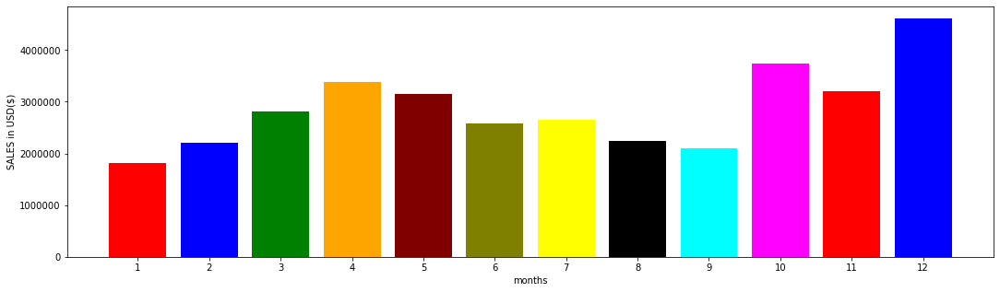

In [60]:
kelvin=plt.figure(figsize=(18,5))
x=range(1,13)
y=data_sales["sales"]
plt.bar(x,y,color=color_names)
plt.xticks(x)
plt.ylabel("SALES in USD($)")
plt.xlabel("months")

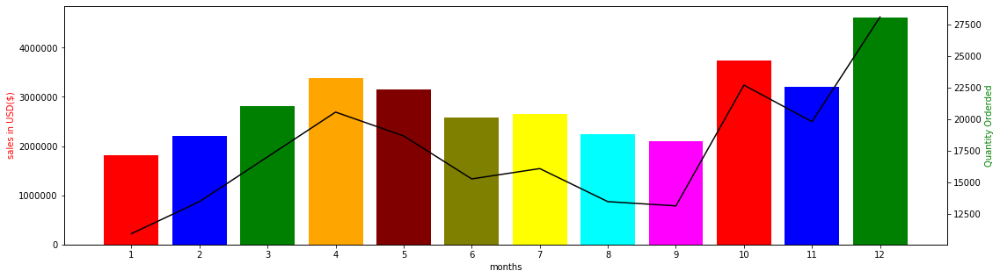

In [63]:

fig, ax1 = plt.subplots(figsize=(18,5))

ax2 = ax1.twinx()
ax1.bar(x,y,color=color_names)
ax2.plot(x,data_sales["QuantityOrdered"], color="black")
plt.xticks(x)
ax1.set_xlabel('months')
ax1.set_ylabel('sales in USD($)', color='R')
ax2.set_ylabel('Quantity Orderded', color="G")
plt.show()

In [77]:
data_nm["OrderDate"]=pd.to_datetime(data_nm["OrderDate"])

C:\Users\eshan\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [109]:
data_nm["Hour"]=data_nm["OrderDate"].dt.hour

data_nm["day"]=data_nm["OrderDate"].dt.day
data_nm.head()

C:\Users\eshan\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\eshan\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales,months,City,Hour,day
0,176558,USB-C Charging Cable,2,11.95,2019-04-19 08:46:00,"917 1st St, Dallas, TX 75001",23.90,4,Dallas ( TX),8,19
1,176559,Bose SoundSport Headphones,1,99.99,2019-04-07 22:30:00,"682 Chestnut St, Boston, MA 02215",99.99,4,Boston ( MA),22,7
2,176560,Google Phone,1,600.00,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",600.00,4,Los Angeles ( CA),14,12
3,176560,Wired Headphones,1,11.99,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",11.99,4,Los Angeles ( CA),14,12
4,176561,Wired Headphones,1,11.99,2019-04-30 09:27:00,"333 8th St, Los Angeles, CA 90001",11.99,4,Los Angeles ( CA),9,30


In [110]:
data_nm["day_name"]=data_nm["OrderDate"].dt.day_name()

C:\Users\eshan\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [111]:
data_nm

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales,months,City,Hour,day,day_name
0,176558,USB-C Charging Cable,2,11.95,2019-04-19 08:46:00,"917 1st St, Dallas, TX 75001",23.90,4,Dallas ( TX),8,19,Friday
1,176559,Bose SoundSport Headphones,1,99.99,2019-04-07 22:30:00,"682 Chestnut St, Boston, MA 02215",99.99,4,Boston ( MA),22,7,Sunday
2,176560,Google Phone,1,600.00,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",600.00,4,Los Angeles ( CA),14,12,Friday
3,176560,Wired Headphones,1,11.99,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",11.99,4,Los Angeles ( CA),14,12,Friday
4,176561,Wired Headphones,1,11.99,2019-04-30 09:27:00,"333 8th St, Los Angeles, CA 90001",11.99,4,Los Angeles ( CA),9,30,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...
186300,259353,AAA Batteries (4-pack),3,2.99,2019-09-17 20:56:00,"840 Highland St, Los Angeles, CA 90001",8.97,9,Los Angeles ( CA),20,17,Tuesday
186301,259354,iPhone,1,700.00,2019-09-01 16:00:00,"216 Dogwood St, San Francisco, CA 94016",700.00,9,San Francisco ( CA),16,1,Sunday
186302,259355,iPhone,1,700.00,2019-09-23 07:39:00,"220 12th St, San Francisco, CA 94016",700.00,9,San Francisco ( CA),7,23,Monday
186303,259356,34in Ultrawide Monitor,1,379.99,2019-09-19 17:30:00,"511 Forest St, San Francisco, CA 94016",379.99,9,San Francisco ( CA),17,19,Thursday


In [112]:
peak_hour=data_nm.groupby("Hour")[["sales","QuantityOrdered"]].sum()
peak_hour

,sales,QuantityOrdered
Hour,,
0,713721.27,4428
1,460866.88,2619
2,234851.44,1398
3,145757.89,928
4,162661.01,937
5,230679.82,1493
6,448113.00,2810
7,744854.12,4556
8,1192348.97,7002


In [113]:
peak_hour=pd.DataFrame(peak_hour)

In [114]:
peak_hour.reset_index(inplace=True)

In [115]:
peak_hour

,Hour,sales,QuantityOrdered
0,0,713721.27,4428
1,1,460866.88,2619
2,2,234851.44,1398
3,3,145757.89,928
4,4,162661.01,937
5,5,230679.82,1493
6,6,448113.00,2810
7,7,744854.12,4556
8,8,1192348.97,7002
9,9,1639030.58,9816


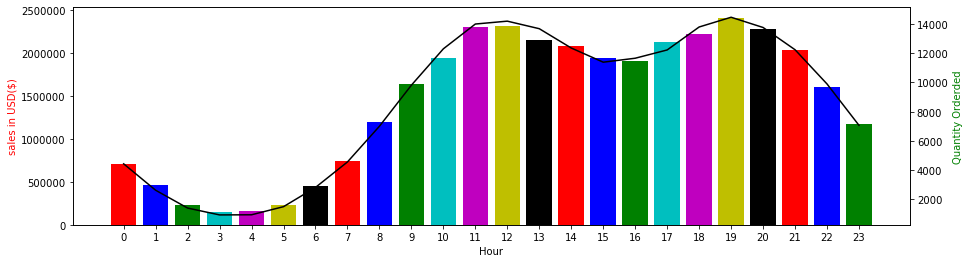

In [116]:
fig, ax1 = plt.subplots(figsize=(15,4))
x=peak_hour["Hour"]
y=peak_hour["sales"]
ax2 = ax1.twinx()
ax1.bar(x,y,color="RBGCMYK")
ax2.plot(x,peak_hour["QuantityOrdered"], color="K")
plt.xticks(x)
ax1.set_xlabel('Hour')
ax1.set_ylabel('sales in USD($)', color='R')
ax2.set_ylabel('Quantity Orderded', color="G")
plt.show()

In [121]:
peak_day=pd.DataFrame(data_nm.groupby("day")[["sales","QuantityOrdered"]].sum())

In [117]:
peak_day_name=pd.DataFrame(data_nm.groupby("day_name")[["sales","QuantityOrdered"]].sum())

In [122]:
peak_day.reset_index(inplace=True)

In [123]:
peak_day

,day,sales,QuantityOrdered
0,1,1166319.25,6867
1,2,1137457.04,6962
2,3,1074432.90,6534
3,4,1163857.72,6813
4,5,1135284.73,6816
5,6,1151956.09,6778
6,7,1094796.63,6779
7,8,1107963.49,6824
8,9,1169250.43,6836
9,10,1169108.73,6965


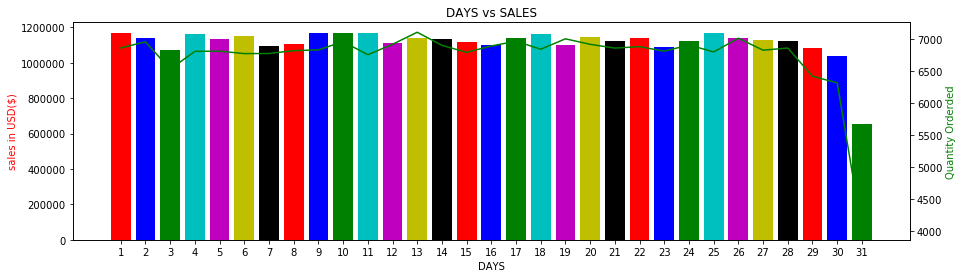

In [128]:
fig

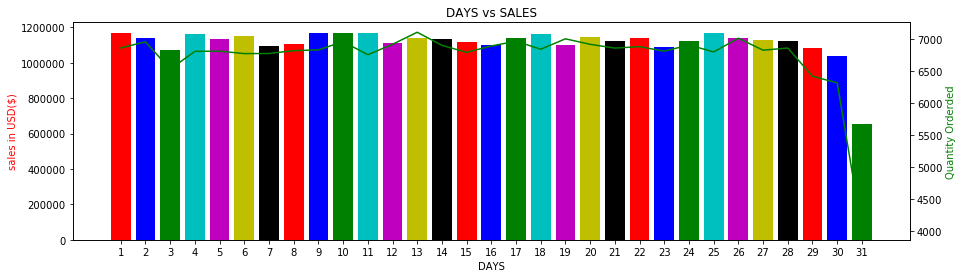

In [127]:
fig, ax1 = plt.subplots(figsize=(15,4))
x=peak_day["day"]
y=peak_day["sales"]
ax2 = ax1.twinx()
ax1.bar(x,y,color="RBGCMYK")
ax2.plot(x,peak_day["QuantityOrdered"], color="g")
plt.xticks(x)
plt.title("DAYS vs SALES")
ax1.set_xlabel('DAYS')
ax1.set_ylabel('sales in USD($)', color='R')
ax2.set_ylabel('Quantity Orderded', color="G")
plt.show()

In [64]:
data_nm.head()

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales,months
0,176558,USB-C Charging Cable,2,11.95,2019-04-19 08:46:00,"917 1st St, Dallas, TX 75001",23.90,4
1,176559,Bose SoundSport Headphones,1,99.99,2019-04-07 22:30:00,"682 Chestnut St, Boston, MA 02215",99.99,4
2,176560,Google Phone,1,600.00,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",600.00,4
3,176560,Wired Headphones,1,11.99,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",11.99,4
4,176561,Wired Headphones,1,11.99,2019-04-30 09:27:00,"333 8th St, Los Angeles, CA 90001",11.99,4


In [85]:
data_nm["Address"][5654].split(",")[1][1:]+" "+data_nm["Address"][5654].split(",")[2][1:3]

'Seattle WA'

In [86]:
data_nm["City"]=data_nm["Address"].apply(lambda x : x.split(",")[1][1:] + " " + "({})".format(x.split(",")[2][1:3]))

In [87]:
data_nm["City"]

0                Dallas (TX)
1                Boston (MA)
2           Los Angeles (CA)
3           Los Angeles (CA)
4           Los Angeles (CA)
                 ...        
185945      Los Angeles (CA)
185946    San Francisco (CA)
185947    San Francisco (CA)
185948    San Francisco (CA)
185949    San Francisco (CA)
Name: City, Length: 185950, dtype: object

In [90]:
city_sales=pd.DataFrame(data_nm.groupby("City")[["sales","QuantityOrdered"]].sum())

In [91]:
city_sales

,sales,QuantityOrdered
City,,
Atlanta (GA),2795498.58,16602
Austin (TX),1819581.75,11153
Boston (MA),3661642.01,22528
Dallas (TX),2767975.40,16730
Los Angeles (CA),5452570.80,33289
New York City (NY),4664317.43,27932
Portland (ME),449758.27,2750
Portland (OR),1870732.34,11303
San Francisco (CA),8262203.91,50239


In [93]:
city_sales=pd.DataFrame(data_nm.groupby("City")[["sales","QuantityOrdered"]].sum())
city_sales.reset_index(inplace=True)

In [94]:
city_sales

,City,sales,QuantityOrdered
0,Atlanta (GA),2795498.58,16602
1,Austin (TX),1819581.75,11153
2,Boston (MA),3661642.01,22528
3,Dallas (TX),2767975.40,16730
4,Los Angeles (CA),5452570.80,33289
5,New York City (NY),4664317.43,27932
6,Portland (ME),449758.27,2750
7,Portland (OR),1870732.34,11303
8,San Francisco (CA),8262203.91,50239
9,Seattle (WA),2747755.48,16553


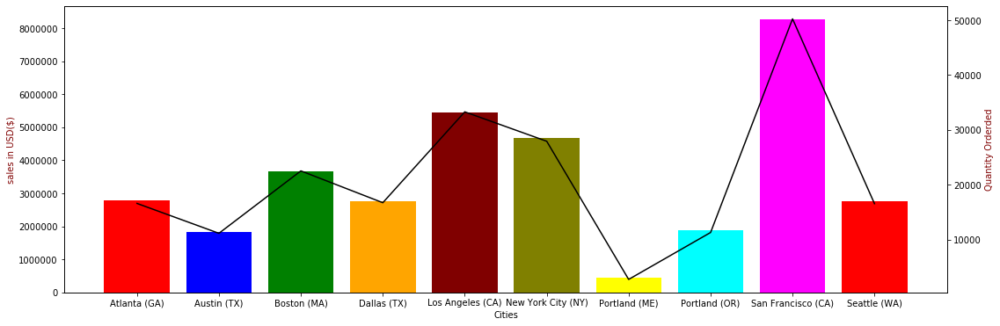

In [95]:
fig, ax1 = plt.subplots(figsize=(18,6))
x=city_sales["City"]
y=city_sales["sales"]
ax2 = ax1.twinx()
ax1.bar(x,y,color=color_names)
ax2.plot(x,city_sales["QuantityOrdered"], color="black")
plt.xticks(x,rotation="vertical")
ax1.set_xlabel('Cities')
ax1.set_ylabel('sales in USD($)', color='maroon')
ax2.set_ylabel('Quantity Orderded', color="maroon")
plt.show()

In [96]:
data_nm.head()

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales,months,City
0,176558,USB-C Charging Cable,2,11.95,2019-04-19 08:46:00,"917 1st St, Dallas, TX 75001",23.90,4,Dallas (TX)
1,176559,Bose SoundSport Headphones,1,99.99,2019-04-07 22:30:00,"682 Chestnut St, Boston, MA 02215",99.99,4,Boston (MA)
2,176560,Google Phone,1,600.00,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",600.00,4,Los Angeles (CA)
3,176560,Wired Headphones,1,11.99,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",11.99,4,Los Angeles (CA)
4,176561,Wired Headphones,1,11.99,2019-04-30 09:27:00,"333 8th St, Los Angeles, CA 90001",11.99,4,Los Angeles (CA)


In [97]:
pd.set_option("display.max_rows",None)

In [102]:
a=data_nm.groupby(["City","Product"]).agg({"sales":sum})

In [103]:
a

sales
City               Product                               
Atlanta (GA)       20in Monitor                  37616.58
                   27in 4K Gaming Monitor       192265.07
                   27in FHD Monitor              88194.12
                   34in Ultrawide Monitor       183155.18
                   AA Batteries (4-pack)          8421.12
                   AAA Batteries (4-pack)         7053.41
                   Apple Airpods Headphones     189900.00
                   Bose SoundSport Headphones   108389.16
                   Flatscreen TV                122100.00
                   Google Phone                 270600.00
                   LG Dryer                      35400.00
                   LG Washing Machine            31200.00
                   Lightning Charging Cable      28091.05
                   Macbook Pro Laptop           644300.00
                   ThinkPad Laptop              356996.43
                   USB-C Charging Cable          22884.25
                   Vareebadd Phone               69200.00
                   Wired Headphones              18932.21
                   iPhone                       380800.00
Austin (TX)        20in Monitor                  25297.70
                   27in 4K Gaming Monitor       124016.82
                   27in FHD Monitor              53996.40
                   34in Ultrawide Monitor       124636.72
                   AA Batteries (4-pack)          5468.16
                   AAA Batteries (4-pack)         4987.32
                   Apple Airpods Headphones     133050.00
                   Bose SoundSport Headphones    70692.93
                   Flatscreen TV                 72600.00
                   Google Phone                 164400.00
                   LG Dryer                      33000.00
                   LG Washing Machine            15600.00
                   Lightning Charging Cable      19539.65
                   Macbook Pro Laptop           426700.00
                   ThinkPad Laptop              209997.90
                   USB-C Charging Cable          14949.45
                   Vareebadd Phone               43200.00
                   Wired Headphones              13548.70
                   iPhone                       263900.00
Boston (MA)        20in Monitor                  43336.06
                   27in 4K Gaming Monitor       263243.25
                   27in FHD Monitor             119542.03
                   34in Ultrawide Monitor       254973.29
                   AA Batteries (4-pack)         11581.44
                   AAA Batteries (4-pack)        10348.39
                   Apple Airpods Headphones     247950.00
                   Bose SoundSport Headphones   141585.84
                   Flatscreen TV                166200.00
                   Google Phone                 355800.00
                   LG Dryer                      35400.00
                   LG Washing Machine            43200.00
                   Lightning Charging Cable      37240.45
                   Macbook Pro Laptop           814300.00
                   ThinkPad Laptop              446995.53
                   USB-C Charging Cable          30603.95
                   Vareebadd Phone               85600.00
                   Wired Headphones              26641.78
                   iPhone                       527100.00
Dallas (TX)        20in Monitor                  37726.57
                   27in 4K Gaming Monitor       187585.19
                   27in FHD Monitor              88044.13
                   34in Ultrawide Monitor       194554.88
                   AA Batteries (4-pack)          8682.24
                   AAA Batteries (4-pack)         7486.96
                   Apple Airpods Headphones     179100.00
                   Bose SoundSport Headphones   106289.37
                   Flatscreen TV                126000.00
                   Google Phone                 276600.00
                   LG Dryer                      2

In [137]:
g = a["sales"].groupby('City',group_keys=False)

In [139]:
for i in g:
    print(i)

(' Atlanta ( GA)', City            Product                   
 Atlanta ( GA)  20in Monitor                   37616.58
                27in 4K Gaming Monitor        192265.07
                27in FHD Monitor               88194.12
                34in Ultrawide Monitor        183155.18
                AA Batteries (4-pack)           8421.12
                AAA Batteries (4-pack)          7053.41
                Apple Airpods Headphones      189900.00
                Bose SoundSport Headphones    108389.16
                Flatscreen TV                 122100.00
                Google Phone                  270600.00
                LG Dryer                       35400.00
                LG Washing Machine             31200.00
                Lightning Charging Cable       28091.05
                Macbook Pro Laptop            644300.00
                ThinkPad Laptop               356996.43
                USB-C Charging Cable           22884.25
                Vareebadd Phone           

In [142]:
res = g.apply(lambda x: x.sort_values(ascending=False).head(5))

In [143]:
res

City                  Product                 
 Atlanta ( GA)        Macbook Pro Laptop           644300.00
                      iPhone                       380800.00
                      ThinkPad Laptop              356996.43
                      Google Phone                 270600.00
                      27in 4K Gaming Monitor       192265.07
 Austin ( TX)         Macbook Pro Laptop           426700.00
                      iPhone                       263900.00
                      ThinkPad Laptop              209997.90
                      Google Phone                 164400.00
                      Apple Airpods Headphones     133050.00
 Boston ( MA)         Macbook Pro Laptop           814300.00
                      iPhone                       527100.00
                      ThinkPad Laptop              446995.53
                      Google Phone                 355800.00
                      27in 4K Gaming Monitor       263243.25
 Dallas ( TX)         Macbook Pro Lapt

In [144]:
top5_product=pd.DataFrame(res)

In [145]:
top5_product

sales
City                 Product                             
 Atlanta ( GA)       Macbook Pro Laptop         644300.00
                     iPhone                     380800.00
                     ThinkPad Laptop            356996.43
                     Google Phone               270600.00
                     27in 4K Gaming Monitor     192265.07
 Austin ( TX)        Macbook Pro Laptop         426700.00
                     iPhone                     263900.00
                     ThinkPad Laptop            209997.90
                     Google Phone               164400.00
                     Apple Airpods Headphones   133050.00
 Boston ( MA)        Macbook Pro Laptop         814300.00
                     iPhone                     527100.00
                     ThinkPad Laptop            446995.53
                     Google Phone               355800.00
                     27in 4K Gaming Monitor     263243.25
 Dallas ( TX)        Macbook Pro Laptop         649400.00
                     iPhone                     363300.00
                     ThinkPad Laptop            344996.55
                     Google Phone               276600.00
                     34in Ultrawide Monitor     194554.88
 Los Angeles ( CA)   Macbook Pro Laptop        1276700.00
                     iPhone                     782600.00
                     ThinkPad Laptop            640993.59
                     Google Phone               508800.00
                     27in 4K Gaming Monitor     391159.97
 New York City ( NY) Macbook Pro Laptop        1116900.00
                     iPhone                     616700.00
                     ThinkPad Laptop            559994.40
                     Google Phone               454800.00
                     34in Ultrawide Monitor     329831.32
 Portland ( ME)      Macbook Pro Laptop         107100.00
                     iPhone                      55300.00
                     ThinkPad Laptop             52999.47
                     Google Phone                46200.00
                     Apple Airpods Headphones    34950.00
 Portland ( OR)      Macbook Pro Laptop         465800.00
                     iPhone                     259700.00
                     ThinkPad Laptop            220997.79
                     Google Phone               166800.00
                     27in 4K Gaming Monitor     136106.51
 San Francisco ( CA) Macbook Pro Laptop        1931200.00
                     iPhone                    1162700.00
                     ThinkPad Laptop            962990.37
                     Google Phone               814800.00
                     27in 4K Gaming Monitor     569385.40
 Seattle ( WA)       Macbook Pro Laptop         605200.00
                     iPhone                     382200.00
                     ThinkPad Laptop            332996.67
                     Google Phone               260400.00
                     27in 4K Gaming Monitor     209814.62

In [146]:
top5_product.reset_index(inplace=True)

In [147]:
import seaborn as sns

C:\Users\eshan\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


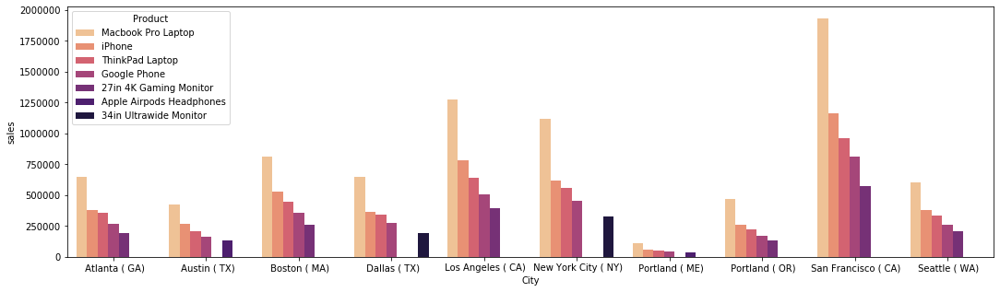

In [149]:
plt.figure(figsize=(18,5))
sns.barplot(top5_product["City"],top5_product["sales"],hue=top5_product["Product"],palette="magma_r")

In [104]:
data_nm.head()

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales,months,City
0,176558,USB-C Charging Cable,2,11.95,2019-04-19 08:46:00,"917 1st St, Dallas, TX 75001",23.90,4,Dallas (TX)
1,176559,Bose SoundSport Headphones,1,99.99,2019-04-07 22:30:00,"682 Chestnut St, Boston, MA 02215",99.99,4,Boston (MA)
2,176560,Google Phone,1,600.00,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",600.00,4,Los Angeles (CA)
3,176560,Wired Headphones,1,11.99,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",11.99,4,Los Angeles (CA)
4,176561,Wired Headphones,1,11.99,2019-04-30 09:27:00,"333 8th St, Los Angeles, CA 90001",11.99,4,Los Angeles (CA)


In [110]:
df = data_nm[data_nm['OrderID'].duplicated(keep=False)]

In [111]:
df

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales,months,City
2,176560,Google Phone,1,600.00,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",600.00,4,Los Angeles (CA)
3,176560,Wired Headphones,1,11.99,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",11.99,4,Los Angeles (CA)
17,176574,Google Phone,1,600.00,2019-04-03 19:42:00,"20 Hill St, Los Angeles, CA 90001",600.00,4,Los Angeles (CA)
18,176574,USB-C Charging Cable,1,11.95,2019-04-03 19:42:00,"20 Hill St, Los Angeles, CA 90001",11.95,4,Los Angeles (CA)
29,176585,Bose SoundSport Headphones,1,99.99,2019-04-07 11:31:00,"823 Highland St, Boston, MA 02215",99.99,4,Boston (MA)
30,176585,Bose SoundSport Headphones,1,99.99,2019-04-07 11:31:00,"823 Highland St, Boston, MA 02215",99.99,4,Boston (MA)
31,176586,AAA Batteries (4-pack),2,2.99,2019-04-10 17:00:00,"365 Center St, San Francisco, CA 94016",5.98,4,San Francisco (CA)
32,176586,Google Phone,1,600.00,2019-04-10 17:00:00,"365 Center St, San Francisco, CA 94016",600.00,4,San Francisco (CA)
118,176672,Lightning Charging Cable,1,14.95,2019-04-12 11:07:00,"778 Maple St, New York City, NY 10001",14.95,4,New York City (NY)
119,176672,USB-C Charging Cable,1,11.95,2019-04-12 11:07:00,"778 Maple St, New York City, NY 10001",11.95,4,New York City (NY)


In [112]:
df["grouped"]=df.groupby('OrderID')['Product'].transform(lambda x : ",".join(x))

In [113]:
df.head()

,OrderID,Product,QuantityOrdered,PriceEach,OrderDate,Address,sales,months,City,grouped
2,176560,Google Phone,1,600.00,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",600.00,4,Los Angeles (CA),"Google Phone,Wired Headphones"
3,176560,Wired Headphones,1,11.99,2019-04-12 14:38:00,"669 Spruce St, Los Angeles, CA 90001",11.99,4,Los Angeles (CA),"Google Phone,Wired Headphones"
17,176574,Google Phone,1,600.00,2019-04-03 19:42:00,"20 Hill St, Los Angeles, CA 90001",600.00,4,Los Angeles (CA),"Google Phone,USB-C Charging Cable"
18,176574,USB-C Charging Cable,1,11.95,2019-04-03 19:42:00,"20 Hill St, Los Angeles, CA 90001",11.95,4,Los Angeles (CA),"Google Phone,USB-C Charging Cable"
29,176585,Bose SoundSport Headphones,1,99.99,2019-04-07 11:31:00,"823 Highland St, Boston, MA 02215",99.99,4,Boston (MA),"Bose SoundSport Headphones,Bose SoundSport Hea..."


In [114]:
df2=df.drop_duplicates("OrderID")

In [140]:
df2["grouped"][2].split(',')

['Google Phone', 'Wired Headphones']

In [141]:
df2["grouped"].value_counts().head()

iPhone,Lightning Charging Cable         882
Google Phone,USB-C Charging Cable       856
iPhone,Wired Headphones                 361
Vareebadd Phone,USB-C Charging Cable    312
Google Phone,Wired Headphones           303
Name: grouped, dtype: int64

In [131]:
from itertools import combinations
from collections import Counter

count = Counter()

for row in df2['grouped']:
    row_list = row.split(',')
    count.update(Counter(combinations(row_list, 2)))



In [132]:
count

Counter({('Google Phone', 'Wired Headphones'): 414,
         ('Google Phone', 'USB-C Charging Cable'): 987,
         ('Bose SoundSport Headphones', 'Bose SoundSport Headphones'): 27,
         ('AAA Batteries (4-pack)', 'Google Phone'): 11,
         ('Lightning Charging Cable', 'USB-C Charging Cable'): 58,
         ('Apple Airpods Headphones', 'ThinkPad Laptop'): 9,
         ('Bose SoundSport Headphones', 'AAA Batteries (4-pack)'): 37,
         ('34in Ultrawide Monitor', 'Google Phone'): 2,
         ('iPhone', 'Lightning Charging Cable'): 1005,
         ('Google Phone', 'Bose SoundSport Headphones'): 220,
         ('Bose SoundSport Headphones', 'Wired Headphones'): 53,
         ('AAA Batteries (4-pack)', '27in FHD Monitor'): 22,
         ('USB-C Charging Cable', 'AAA Batteries (4-pack)'): 45,
         ('iPhone', 'Wired Headphones'): 447,
         ('iPhone', '27in 4K Gaming Monitor'): 6,
         ('ThinkPad Laptop', 'AAA Batteries (4-pack)'): 16,
         ('iPhone', 'Apple Airpods Headph

In [143]:
count.most_common(15)

[(('iPhone', 'Lightning Charging Cable'), 1005),
 (('Google Phone', 'USB-C Charging Cable'), 987),
 (('iPhone', 'Wired Headphones'), 447),
 (('Google Phone', 'Wired Headphones'), 414),
 (('Vareebadd Phone', 'USB-C Charging Cable'), 361),
 (('iPhone', 'Apple Airpods Headphones'), 360),
 (('Google Phone', 'Bose SoundSport Headphones'), 220),
 (('USB-C Charging Cable', 'Wired Headphones'), 160),
 (('Vareebadd Phone', 'Wired Headphones'), 143),
 (('Lightning Charging Cable', 'Wired Headphones'), 92),
 (('Lightning Charging Cable', 'Apple Airpods Headphones'), 81),
 (('Vareebadd Phone', 'Bose SoundSport Headphones'), 80),
 (('USB-C Charging Cable', 'Bose SoundSport Headphones'), 77),
 (('Apple Airpods Headphones', 'Wired Headphones'), 69),
 (('Lightning Charging Cable', 'USB-C Charging Cable'), 58)]

In [134]:
for key,value in count.most_common():
    print(key, value)

('iPhone', 'Lightning Charging Cable') 1005
('Google Phone', 'USB-C Charging Cable') 987
('iPhone', 'Wired Headphones') 447
('Google Phone', 'Wired Headphones') 414
('Vareebadd Phone', 'USB-C Charging Cable') 361
('iPhone', 'Apple Airpods Headphones') 360
('Google Phone', 'Bose SoundSport Headphones') 220
('USB-C Charging Cable', 'Wired Headphones') 160
('Vareebadd Phone', 'Wired Headphones') 143
('Lightning Charging Cable', 'Wired Headphones') 92
('Lightning Charging Cable', 'Apple Airpods Headphones') 81
('Vareebadd Phone', 'Bose SoundSport Headphones') 80
('USB-C Charging Cable', 'Bose SoundSport Headphones') 77
('Apple Airpods Headphones', 'Wired Headphones') 69
('Lightning Charging Cable', 'USB-C Charging Cable') 58
('Lightning Charging Cable', 'AA Batteries (4-pack)') 55
('Lightning Charging Cable', 'Lightning Charging Cable') 54
('Bose SoundSport Headphones', 'Wired Headphones') 53
('AA Batteries (4-pack)', 'Lightning Charging Cable') 51
('AAA Batteries (4-pack)', 'USB-C Chargin

In [144]:
sold_most=pd.DataFrame(data_nm.groupby("Product")[["sales","QuantityOrdered"]].sum())

In [145]:
sold_most.reset_index(inplace=True)

In [146]:
sold_most.head()

,Product,sales,QuantityOrdered
0,20in Monitor,454148.71,4129
1,27in 4K Gaming Monitor,2435097.56,6244
2,27in FHD Monitor,1132424.50,7550
3,34in Ultrawide Monitor,2355558.01,6199
4,AA Batteries (4-pack),106118.40,27635


In [147]:


plt.style.use('dark_background')

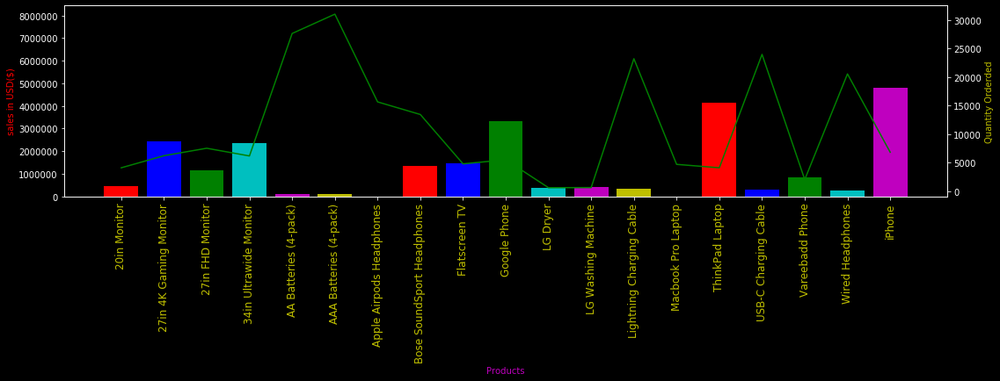

In [148]:
fig, ax1 = plt.subplots(figsize=(18,4))
x=sold_most["Product"]
y=sold_most["sales"]
ax2 = ax1.twinx()
ax1.bar(x,y,color="RBGCMYK")
ax2.plot(x,sold_most["QuantityOrdered"], color="g")

ax1.set_xlabel('Products',color="M")
ax1.set_ylabel('sales in USD($)', color='R')
ax2.set_ylabel('Quantity Orderded', color="y")
ax1.set_xticklabels(sold_most["Product"], rotation='vertical', size=12,color="y")

plt.show()